# Getting Gensim Embeddings

In [1]:
#Downloading the glove embeddings from gensim
import gensim.downloader
#from gensim import glove2word2vec
#from gensim.models.keyedvectors import KeyedVectors

#word2vec_vectors = gensim.downloader.load('word2vec-google-news-300')
#weights = torch.FloatTensor(word2vec_vectors.vectors) 

glove_model = gensim.downloader.load('glove-wiki-gigaword-300')


In [2]:
#Getting the vocabulary list, array of vectors per word and indices (word2idx)
vocab=glove_model.index_to_key #list
vectors=glove_model.vectors #list of arrays
word2idx = {word: idx for idx, word in enumerate(vocab)} #dictionary: word, index
print(f"vectors shape: {vectors.shape}, word2idx length: {len(word2idx)}, vocab length: {len(vocab)}")

vectors shape: (400000, 300), word2idx length: 400000, vocab length: 400000


In [3]:
#creating a dictionary to access the embeddings with word as key and vectors as values
dict_glove = dict({})
for idx, key in enumerate(glove_model.key_to_index):
    dict_glove[key] = glove_model[key]
    

In [4]:
from tqdm import tqdm
import string
import numpy as np

def has_punct(word):
    if any([punct in string.punctuation for punct in word]):
        return True
    return False

def has_digit(word):
    if any([digit in string.digits for digit in word]):
        return True
    return False

def exclude_punctuation(words):
    vocab_limited = []
    for word in tqdm(words[:len(words)]): 
        if word.lower() != word :
            continue
        if len(word) >= 20: 
            continue
        if has_digit(word) | has_punct(word): 
            continue
        if '_' in word:
            p = [has_punct(subw) for subw in word.split('_')]
            if not any(p):
                vocab_limited.append(word)
            continue
        vocab_limited.append(word)
    return vocab_limited


def limit_vocab(word_vector, word_index, vocab, exclude = None):
    vocab_limited=exclude_punctuation(vocab)
    if exclude:
       vocab_limited = list(set(vocab_limited) - set(exclude))

    print("Size of limited vocabulary:", len(vocab_limited))
    
    wv_limited = np.zeros((len(vocab_limited), len(word_vector[0, :])))
    for index,word in enumerate(vocab_limited):
        wv_limited[index,:] = word_vector[word_index[word],:]
    
    w2i_limited = {word: index for index, word in enumerate(vocab_limited)}
    dict_vectors_limit = {word: wv_limited[index,:] for index, word in enumerate(vocab_limited)}
    return vocab_limited, wv_limited, w2i_limited, dict_vectors_limit

In [5]:
vocab_cleaned, vectors_cleaned, word2idx_cleaned, dict_vectors_limit = limit_vocab(vectors, word2idx, vocab)

100%|██████████| 400000/400000 [00:00<00:00, 777609.65it/s]


Size of limited vocabulary: 327185


In [6]:
vocab_cleaned2, vectors_cleaned2, word2idx_cleaned2, dict_vectors_limit2 = limit_vocab(vectors, word2idx, vocab, exclude=vocab_cleaned[1001:])

100%|██████████| 400000/400000 [00:00<00:00, 764503.99it/s]

Size of limited vocabulary: 1001


In [7]:
def cosine_similarity(v, w):
    
    dot_product=np.dot(v,w)
    product_norms=np.linalg.norm(v)*np.linalg.norm(w)
    cosine_similarity = dot_product/product_norms
    
    return cosine_similarity


In [8]:
similarities_array=np.array([[cosine_similarity(dict_vectors_limit2[x], dict_vectors_limit2[y]) for y in vocab_cleaned2] for x in vocab_cleaned2])

In [9]:
similarities_array.shape

(1001, 1001)

In [10]:
connections=similarities_array.copy()

In [11]:
connections[connections>=0.5]=1
connections[connections <0.5 ] = 0



In [12]:
connections

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [13]:
connections.shape

(1001, 1001)

In [14]:
connections *= np.tri(*connections.shape)

In [15]:
np.fill_diagonal(connections, 0)

In [16]:
connections

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [17]:
import pandas as pd
similarities_df = pd.DataFrame(similarities_array)


In [18]:

similarities_df=similarities_df.set_axis([vocab_cleaned2], axis=1)
similarities_df=similarities_df.set_axis([vocab_cleaned2], axis='index')

In [19]:
simil=np.array(similarities_df)

# The Embeddings Network



Importing the required dependencies

In [20]:
import numpy as np

In [21]:
from graph_tool.all import *

objc[9461]: Class GNotificationCenterDelegate is implemented in both /Users/angeladuarte/opt/miniconda3/envs/gt/lib/libgio-2.0.0.dylib (0x1ae699c30) and /usr/local/Cellar/glib/2.76.1/lib/libgio-2.0.0.dylib (0x1cd7316b0). One of the two will be used. Which one is undefined.


In [33]:
g = Graph(np.array(np.nonzero(connections)).T, directed=False)


In [34]:
g.set_directed(False)

In [35]:
print(g)

<Graph object, undirected, with 1001 vertices and 20170 edges, at 0x1ea8d6c10>


In [36]:
vnames = g.new_vertex_property("string")         # vertex names




In [37]:
for i in range(len(vocab_cleaned2)):
    vnames[g.vertex(i)] = vocab_cleaned2[i]

In [38]:
g.list_properties()

In [39]:
g.vertex_properties

{}

## Degree Distribution

In [40]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib

In [41]:
hist = vertex_hist(g, deg="total")


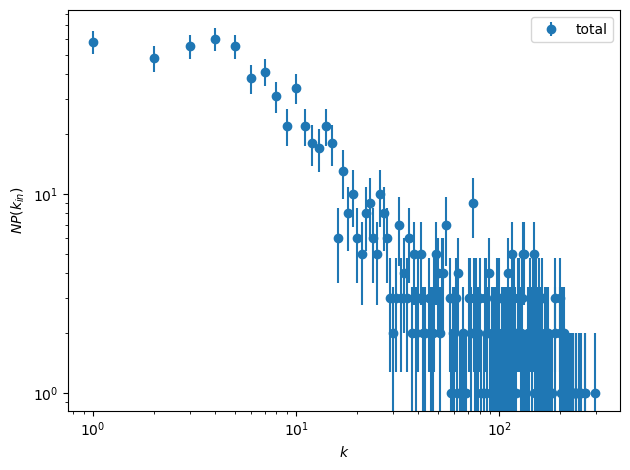

In [42]:
y = hist[0]
err = np.sqrt(hist[0])
plt.errorbar(hist[1][:-1], hist[0], fmt="o", yerr=err,
        label="total")

plt.yscale("log")
plt.xscale("log")

plt.xlabel("$k$")
plt.ylabel("$NP(k_{in})$")

plt.tight_layout()
plt.legend()

### select a subgraph for visualization

In [43]:
u = extract_largest_component(g)

print(u)

u = Graph(u, prune=True)

print(u)

<GraphView object, undirected, with 963 vertices and 20165 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1ecfe3850, at 0x1cdf03990>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1ecfe3850, at 0x1ed0cfad0>, False), at 0x1ecfe3850>
<Graph object, undirected, with 963 vertices and 20165 edges, at 0x1ece0f050>


### spring layout

In [44]:
pos = sfdp_layout(u)

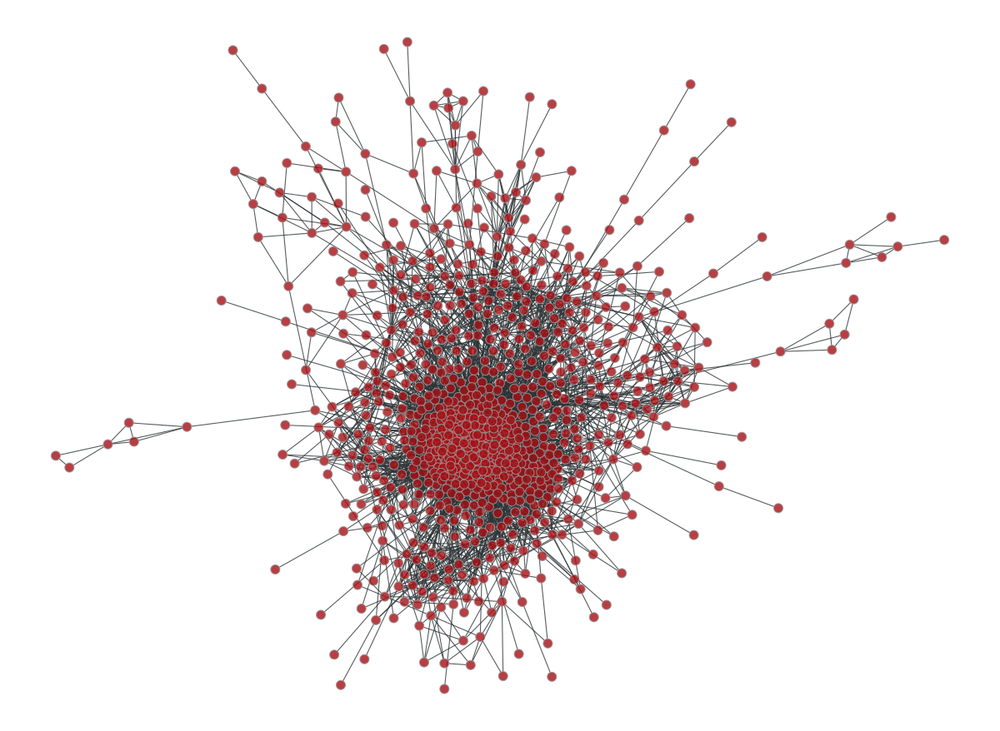

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ecf5ed90>

In [45]:
graph_draw(u, pos)

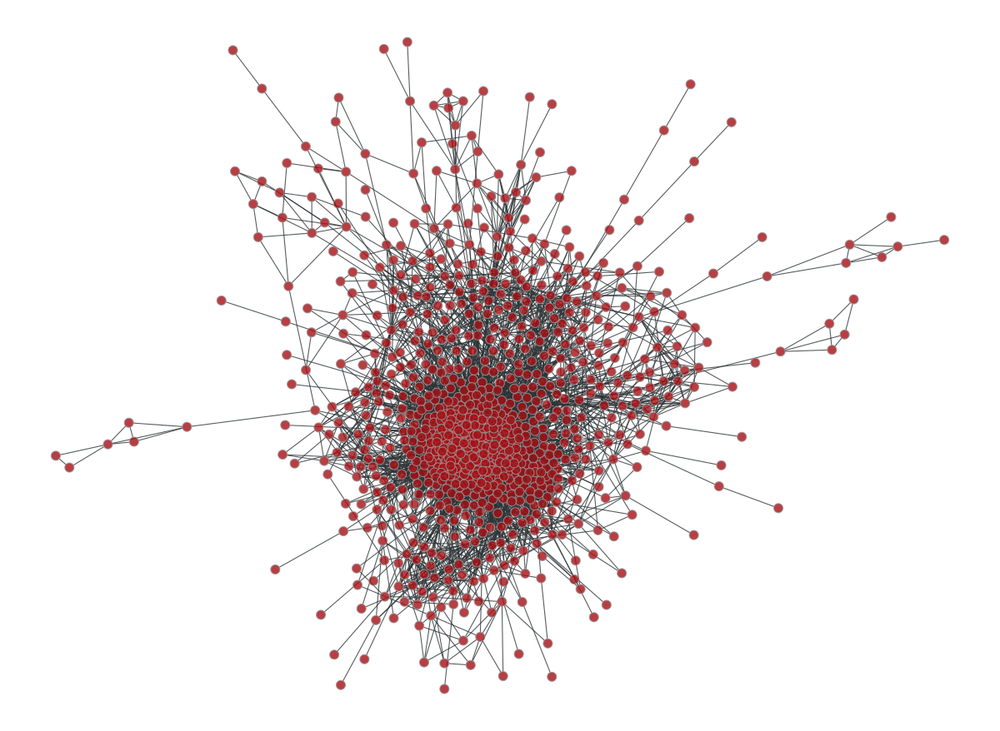

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ed0d7150>

In [46]:
graph_draw(u, pos=pos)

### fruchterman_reingold

In [47]:
pos_fr = fruchterman_reingold_layout(u, n_iter=100)

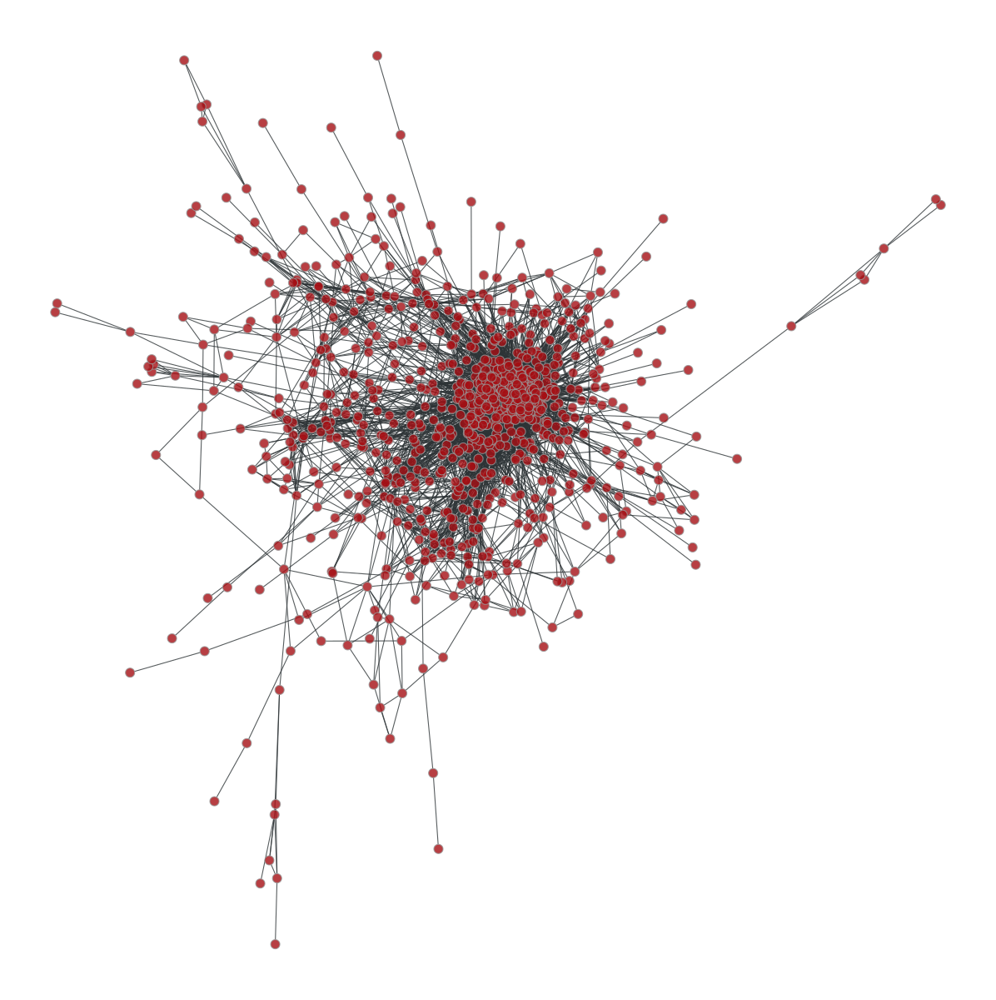

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1cdeaf810>

In [48]:
graph_draw(u, pos_fr)

Radial tree

In [49]:
pos_tree = radial_tree_layout(u, 0)

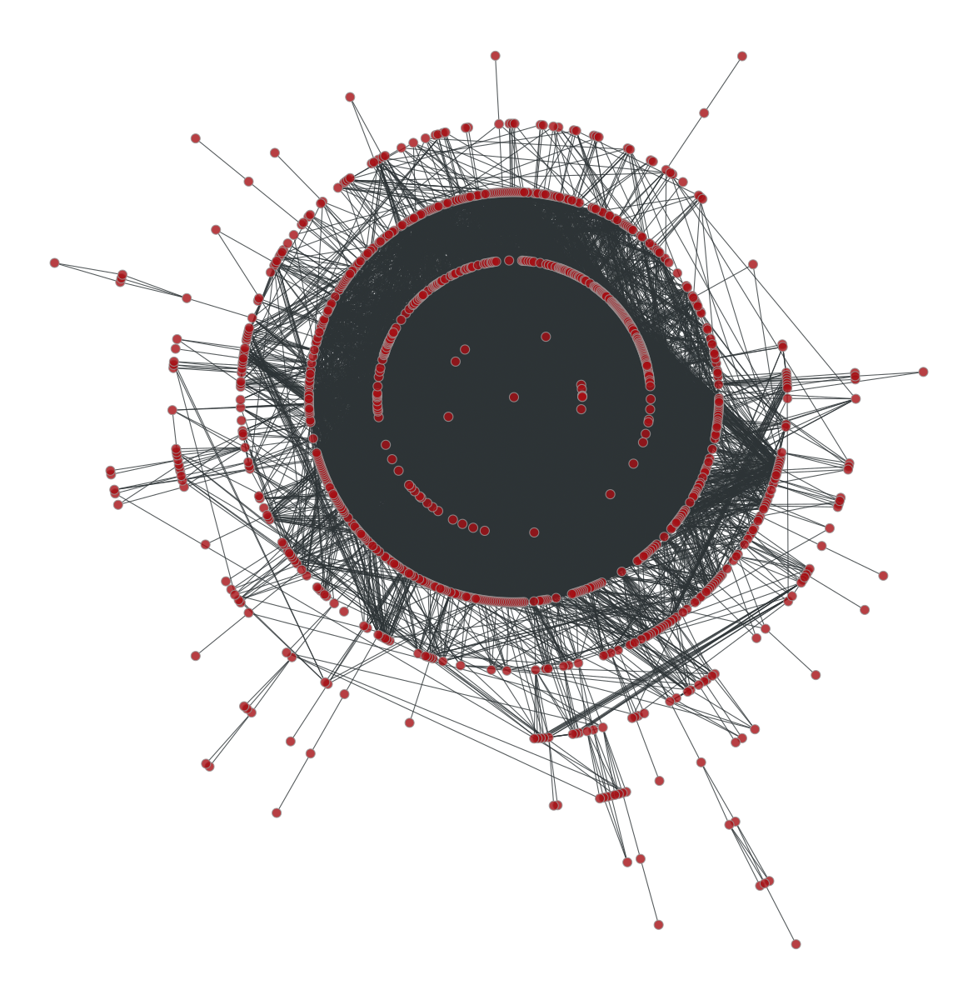

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ecf505d0>

In [50]:
graph_draw(u, pos_tree)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 1

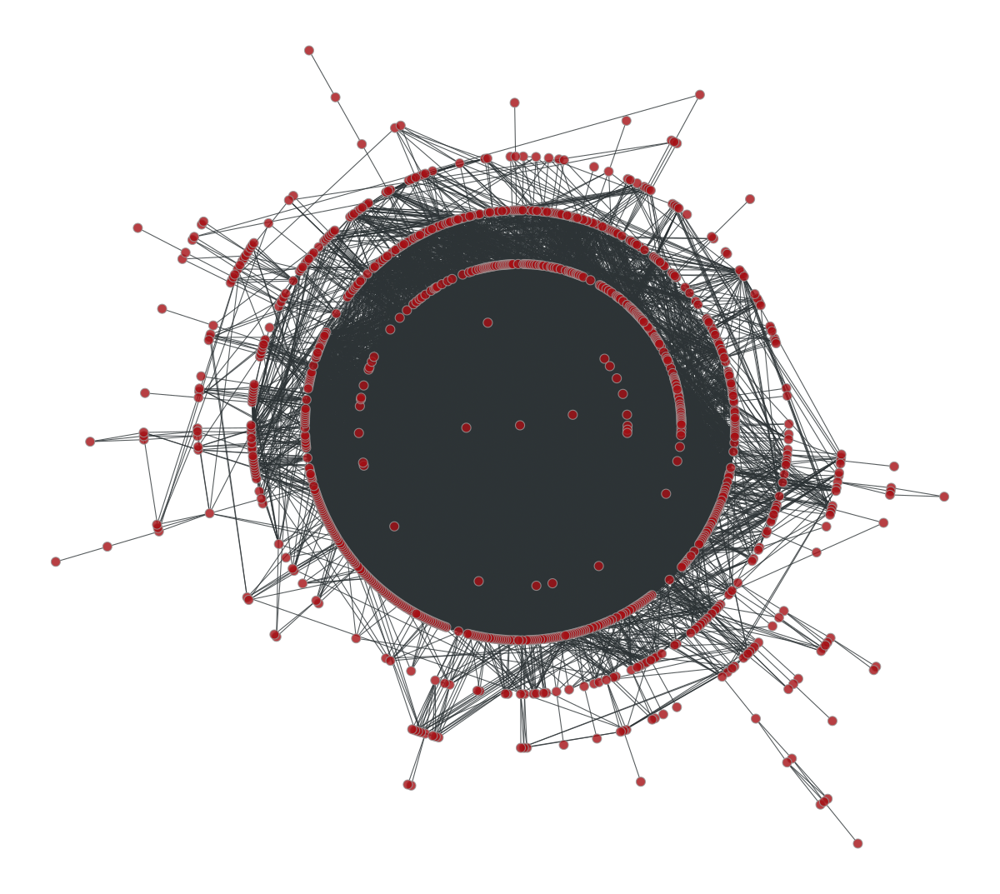

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ecfd3210>

In [51]:
maximum = max(u.get_in_degrees(u.get_vertices()))

print(np.where(u.get_in_degrees(u.get_vertices()) == maximum))
print(u.get_in_degrees(u.get_vertices()))

pos_tree = radial_tree_layout(u, 1)

graph_draw(u, pos_tree)

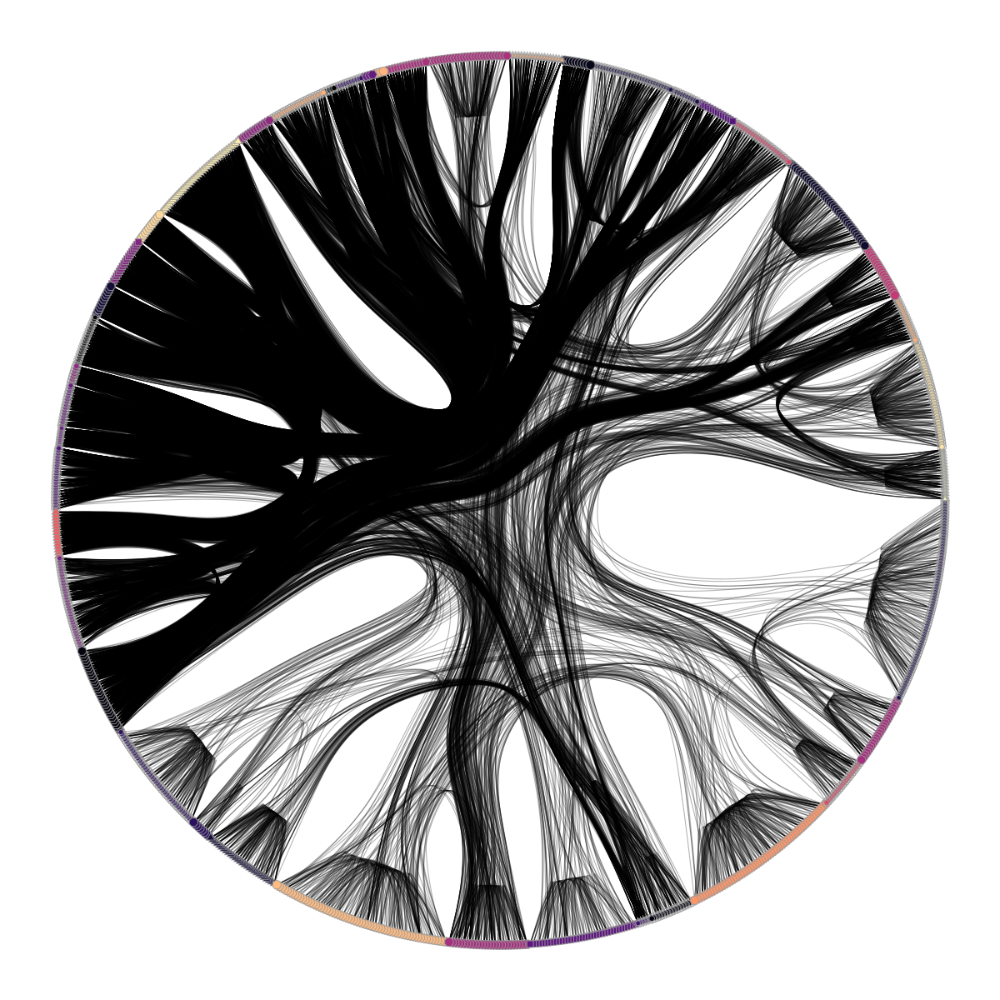

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ecf5c810>

In [52]:
state = minimize_nested_blockmodel_dl(u)

t = get_hierarchy_tree(state)[0]

tpos = pos = radial_tree_layout(t, t.vertex(t.num_vertices() - 1, use_index=False), weighted=True)

cts = get_hierarchy_control_points(u, t, tpos)

pos = u.own_property(tpos)

b = state.levels[0].b

shape = b.copy()

shape.a %= 14

graph_draw(u, pos=pos, vertex_fill_color=b, vertex_shape=shape, edge_control_points=cts,

              edge_color=[0, 0, 0, 0.3], vertex_anchor=0)

shortest paths

[ 5  0  3  5  4  4  4  3  6  4  5  7  7  3  3  4  5  4  2  3  5  6  5  3
  4  3  3  4  4  7  6  1  6  5  6  7  3  5  4  5  4  3  3  5  3  6  3  4
  5  5  3  5  5  4  5  4  3  4  4  3  4  7  4  5  4  5  4  4  5  4  4  4
  5  6  4  4  4  5  3  4  4  4  4  7  4  3  5  4  4  5  9  4  4  5  4  3
  4  4  5  4  4  6  4  6  3  5  4  4  4  6  4  4  4  5  5  5  4  5  3  4
  4  4  4  5  4  4  4  5  6  4  4  3  4  5  4  4  4  3  5  5  4  4  4  3
  6  4  5  2  4  5  4  5  4  4  5  3  4  5  4  4  4  5  5  6  4  5  5  4
  5  4  6  4  3  4  6  5  3  4  3  4  4  4  6  5  4  5  7  3  4  3  5  4
  8  4  5  4  6  5  4  4  4  4  4  4  3  4  7  3  3  4  4  4  7  5  3  5
  4  6  6  3  5  4  5  4  6  3  3  5  3  5  5  5  4  5  4  4  3  6  4  4
  8  5  4  5  4  4  3  6  4  5  3  5  3  4  3  4  3  4  4  6  5  4  5  5
  4  4  2  4  3  5  4  4  4  3  3  4  4  3  5  7  4  4  4  3  7  4  4  4
  5  3  4  5  6  5  5  4  5  4  5  3  3  4  6  3  4  3  5  4  5  4  4  4
  5  4  3  6  5  4  4  4  5  4  5  4  4  5  3  4  4

(array([  1.,   2.,   9., 161., 442., 208.,  92.,  33.,  10.,   5.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <BarContainer object of 10 artists>)

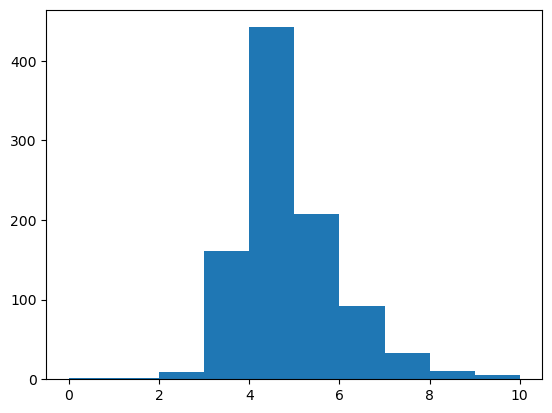

In [53]:
dist = shortest_distance(u, source=u.vertex(1))

print(dist.a)

plt.hist(dist.a)

[0.00000e+00 4.03290e+04 2.17156e+05 2.84705e+05 2.14625e+05 1.06413e+05
 4.18550e+04 1.52250e+04 4.80000e+03 1.08400e+03 1.74000e+02 3.40000e+01
 6.00000e+00]


<BarContainer object of 13 artists>

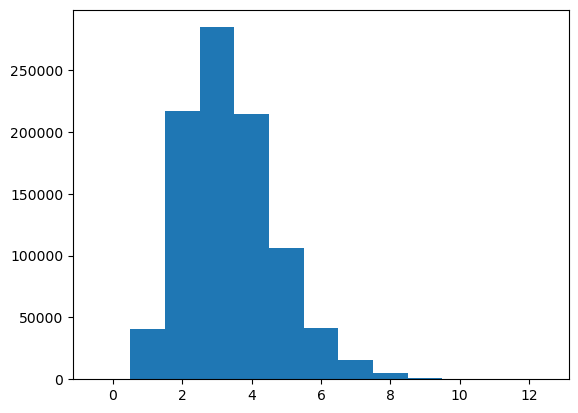

In [54]:
hist, bin_edges = distance_histogram(u)
print(hist)
plt.bar(bin_edges[:-1], hist, width=1)

In [55]:
dist = shortest_distance(u)

average_path_length = vertex_average(u, dist)
print(np.mean(average_path_length))

1.7029551522895732028


### percolation threshold

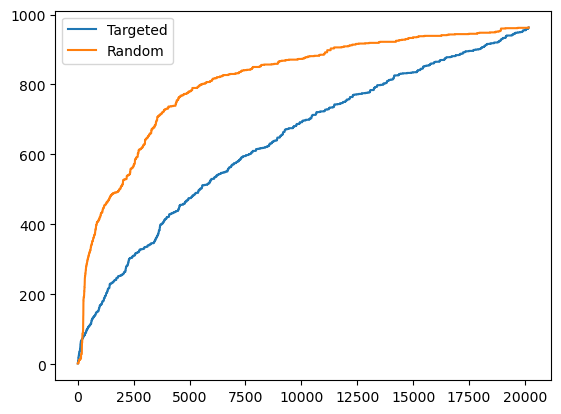

In [56]:
edges = sorted([(e.source(), e.target()) for e in u.edges()],
               key=lambda e: e[0].in_degree() * e[1].in_degree())

sizes, comp = edge_percolation(u, edges)

np.random.shuffle(edges)

sizes2, comp = edge_percolation(u, edges)

plt.plot(sizes, label="Targeted")

plt.plot(sizes2, label="Random")

plt.legend()

### k-core decomposition

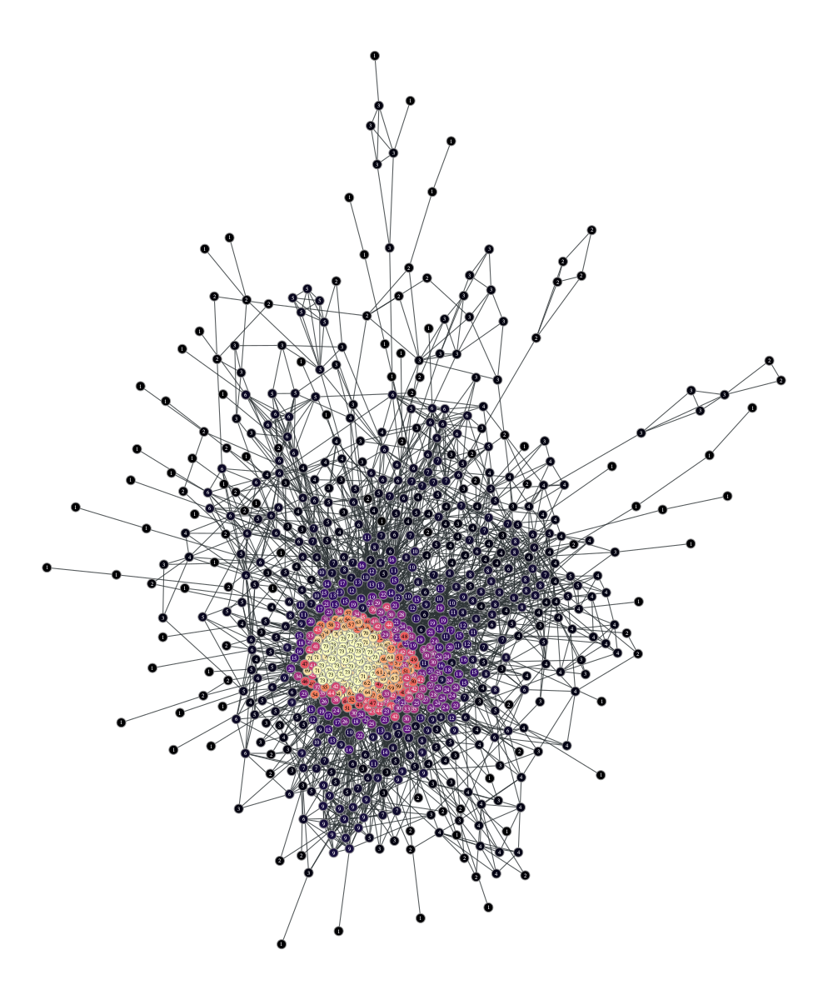

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ed9548d0>

In [57]:
kcore = kcore_decomposition(u)
graph_draw(u, vertex_fill_color=kcore, vertex_text=kcore)

In [58]:
pseudo_diameter(u)

(12.0,
 (<Vertex object with index '341' at 0x1ed1a3cc0>,
  <Vertex object with index '857' at 0x1ed1a3b40>))

### centrality measures

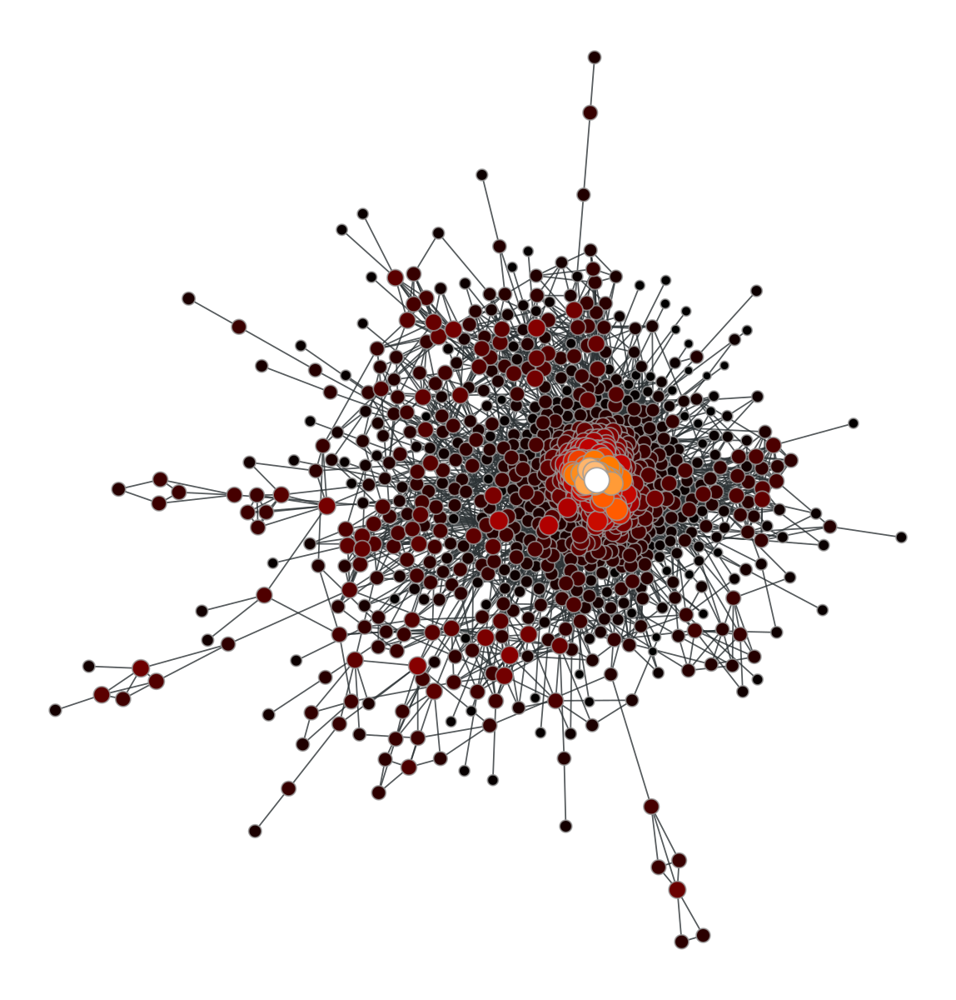

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1eddb7210>

In [61]:
pr = pagerank(u)

graph_draw(u, vertex_fill_color=pr, 

              vertex_size=prop_to_size(pr, mi=5, ma=15),

              vorder=pr, vcmap=matplotlib.cm.gist_heat)

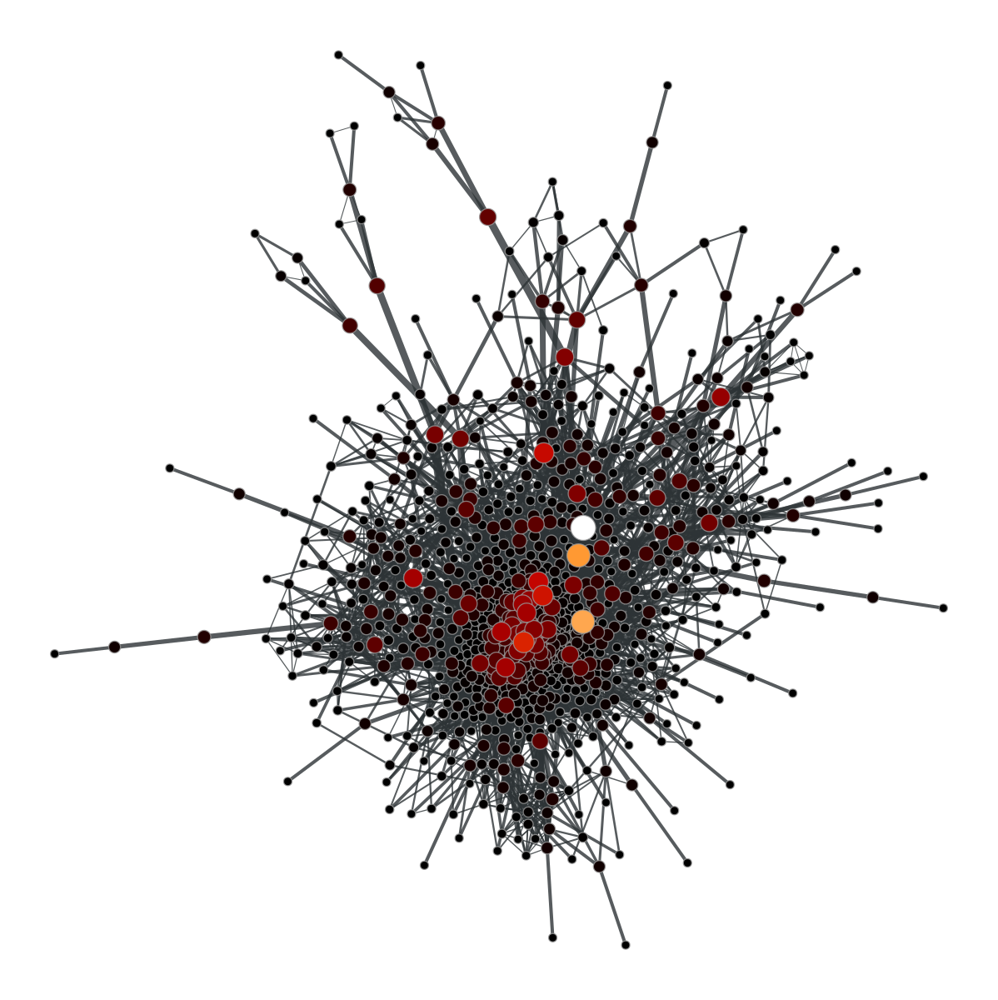

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ed9556d0>

In [62]:
vp, ep = betweenness(u)

graph_draw(u, vertex_fill_color=vp,

              vertex_size=prop_to_size(vp, mi=5, ma=15),

              edge_pen_width=prop_to_size(ep, mi=0.5, ma=5),

              vcmap=matplotlib.cm.gist_heat,

              vorder=vp)

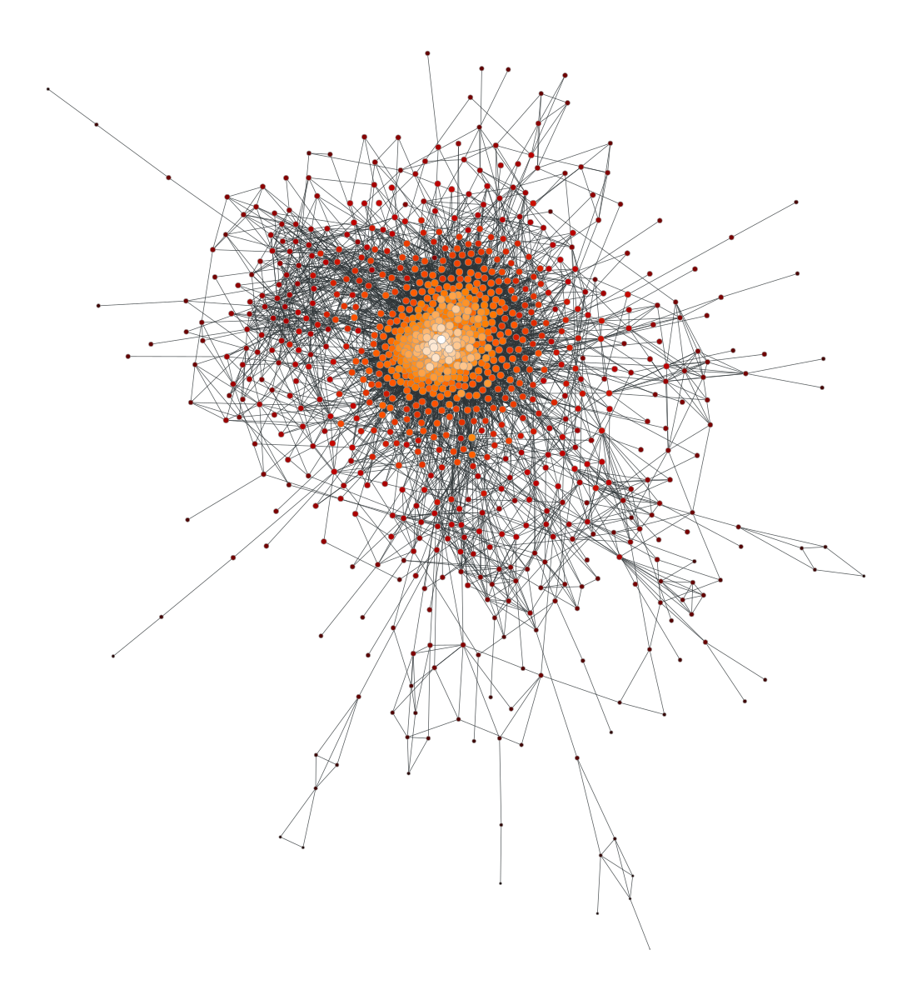

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ed2f5150>

In [63]:
c = closeness(u)

graph_draw(u, vertex_fill_color=c,

              vertex_size=prop_to_size(c, mi=0.5, ma=5),

              vcmap=matplotlib.cm.gist_heat,

              vorder=c)

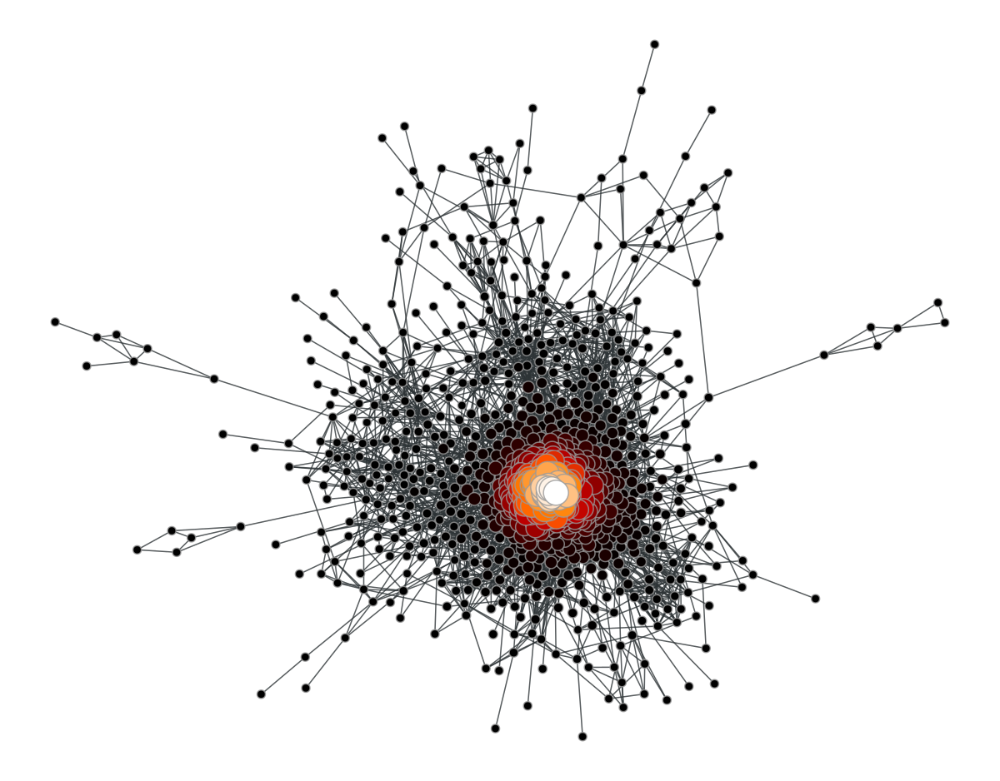

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ed949690>

In [64]:
ee, x = eigenvector(u)

graph_draw(u, vertex_fill_color=x,

              vertex_size=prop_to_size(x, mi=5, ma=15),

              vcmap=matplotlib.cm.gist_heat,

              vorder=x)

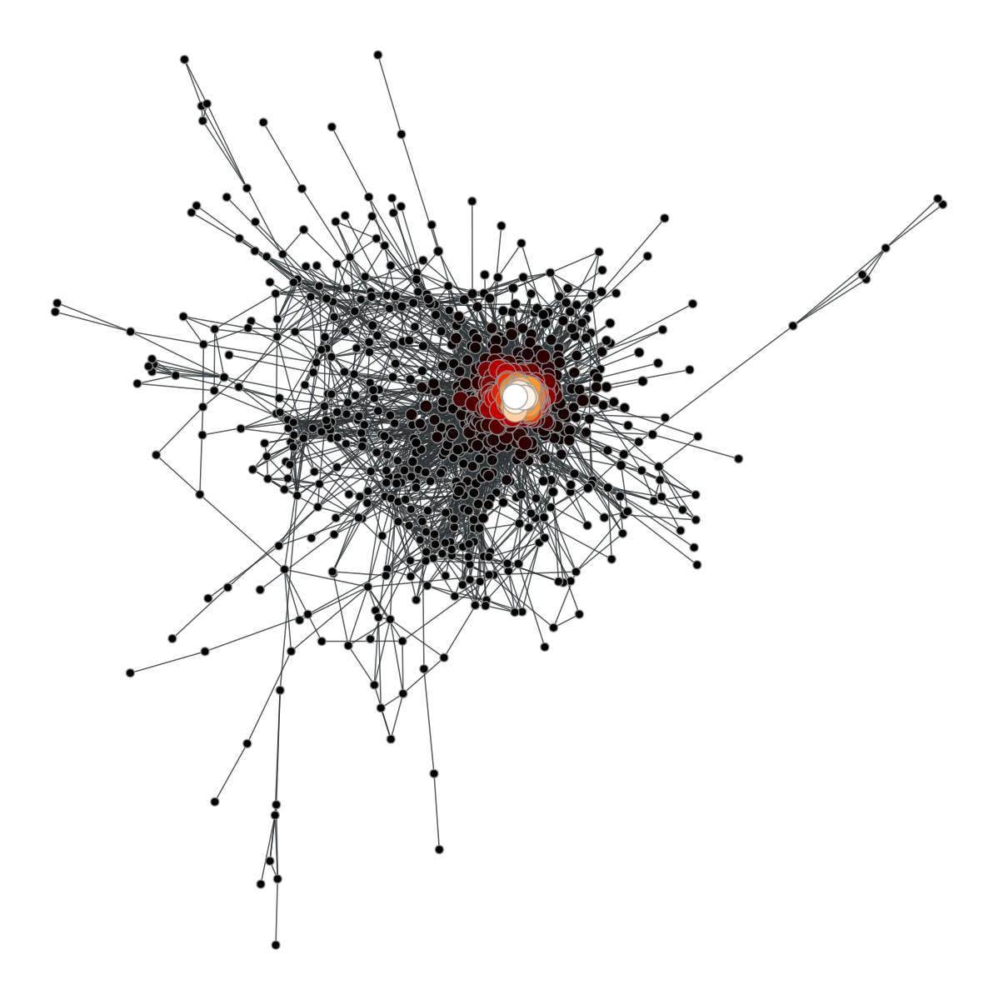

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ed948c90>

In [65]:
graph_draw(u, pos=pos_fr, vertex_fill_color=x,

              vertex_size=prop_to_size(x, mi=5, ma=15),

              vcmap=matplotlib.cm.gist_heat,

              vorder=x)

In [66]:
clust = local_clustering(u)

print(vertex_average(u, clust))

(0.4633774213161766, 0.00806366323205725)


In [67]:
print(clust.a)

[0.22222222 0.         0.66666667 0.30882353 0.         0.60507246
 0.47619048 0.82539683 0.53333333 0.64452938 1.         0.
 0.         0.80295567 0.54392237 0.58241758 0.35714286 0.5620915
 1.         0.29411765 0.         0.5        0.34545455 0.55502392
 0.42857143 0.58372457 0.43232323 0.4952381  0.25757576 0.
 0.33333333 0.10714286 0.16666667 0.19444444 1.         0.
 0.52741152 0.31111111 0.44729345 0.73333333 0.44736842 0.
 0.51384275 0.46153846 0.40460506 1.         0.62317073 0.65225718
 0.         0.         0.46404586 0.47619048 0.8        0.60224381
 0.2        0.         0.43592327 0.         0.16374269 0.4
 0.65309145 0.33333333 0.63756614 0.33333333 0.31868132 0.64444444
 0.79259259 0.22222222 0.256917   0.6        0.83150183 0.41666667
 0.16666667 0.33333333 0.78623188 0.64978524 0.4        0.67857143
 0.46229508 0.6        0.6367054  0.4718894  0.46666667 0.33333333
 0.65754386 0.74022989 0.28888889 0.6072695  0.21846154 0.33333333
 1.         0.82428356 0.66666667 0

In [68]:
degs = u.get_total_degrees(u.get_vertices())

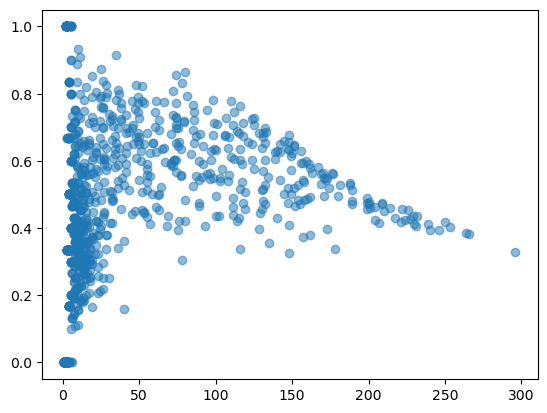

In [69]:
plt.scatter(degs, clust.a, alpha=0.5) 

Blockmodel

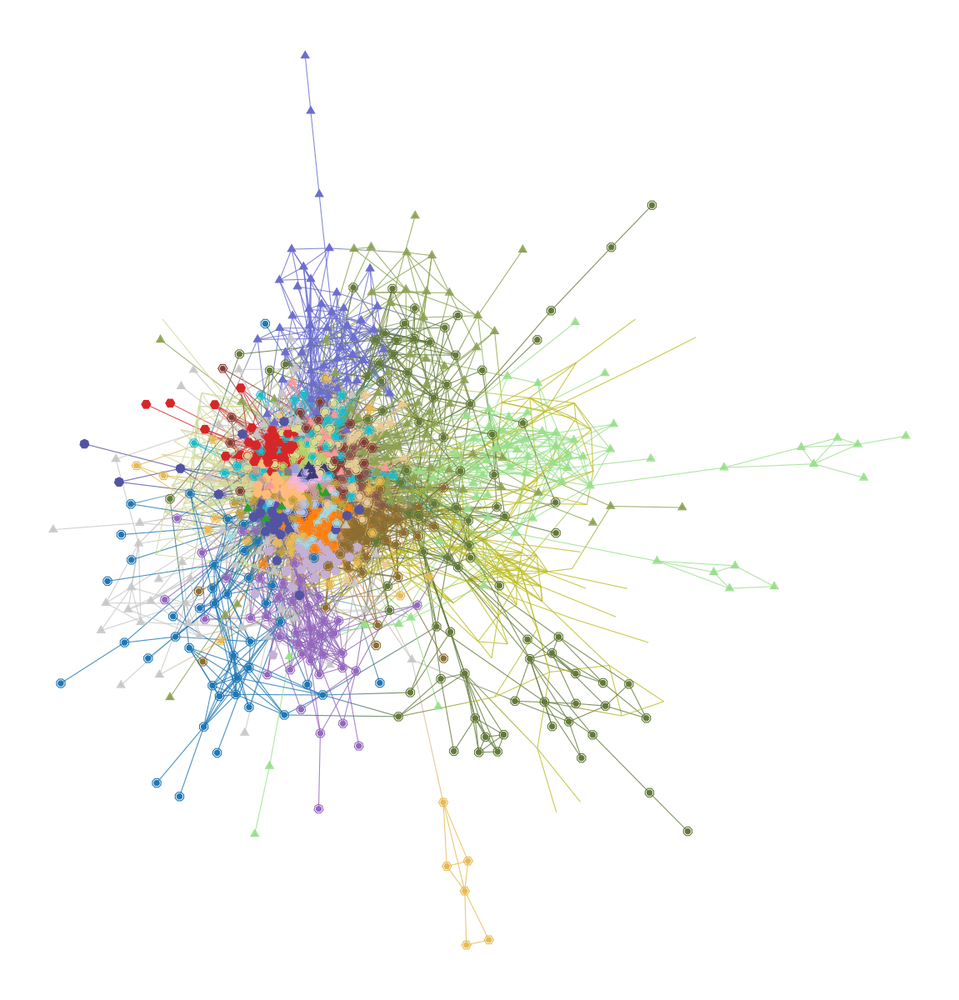

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ecd68190>

In [70]:
state = minimize_blockmodel_dl(u)

state.draw(vertex_shape=state.get_blocks())

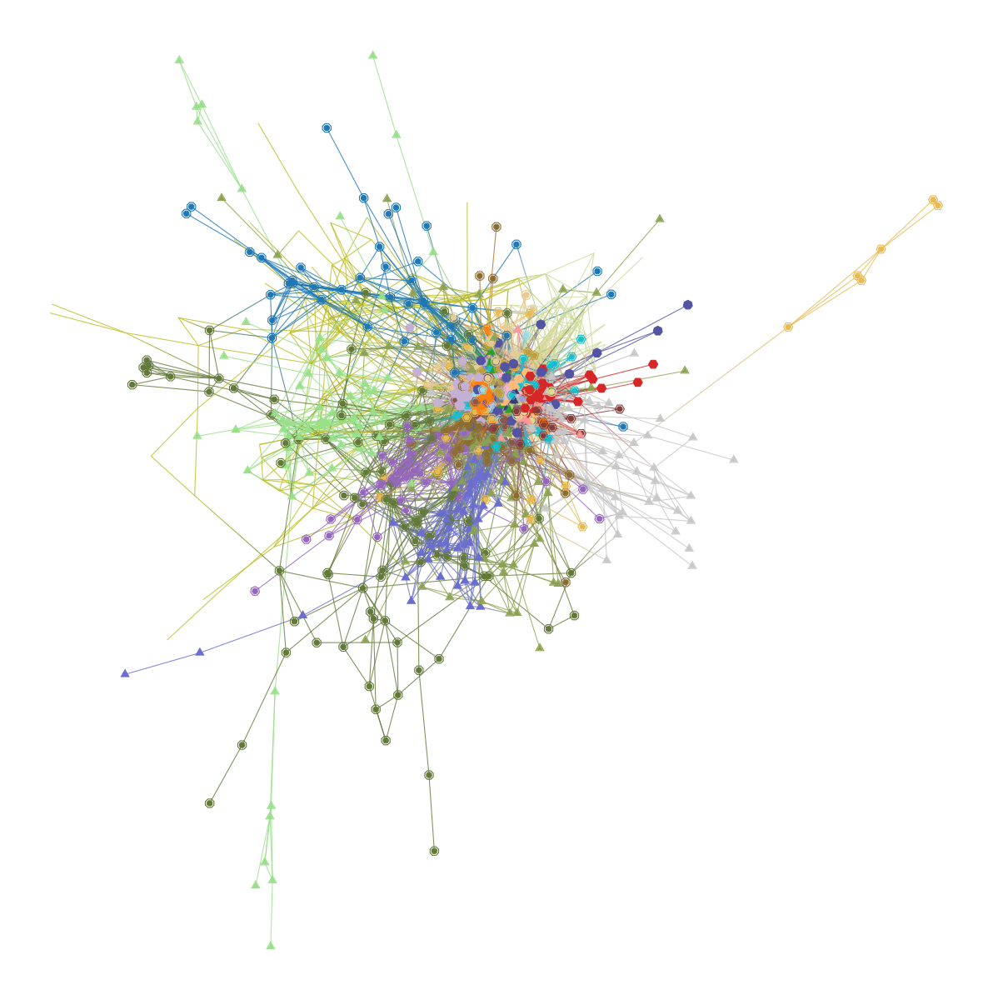

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1edebca50>

In [71]:
state.draw(pos=pos_fr, vertex_shape=state.get_blocks())

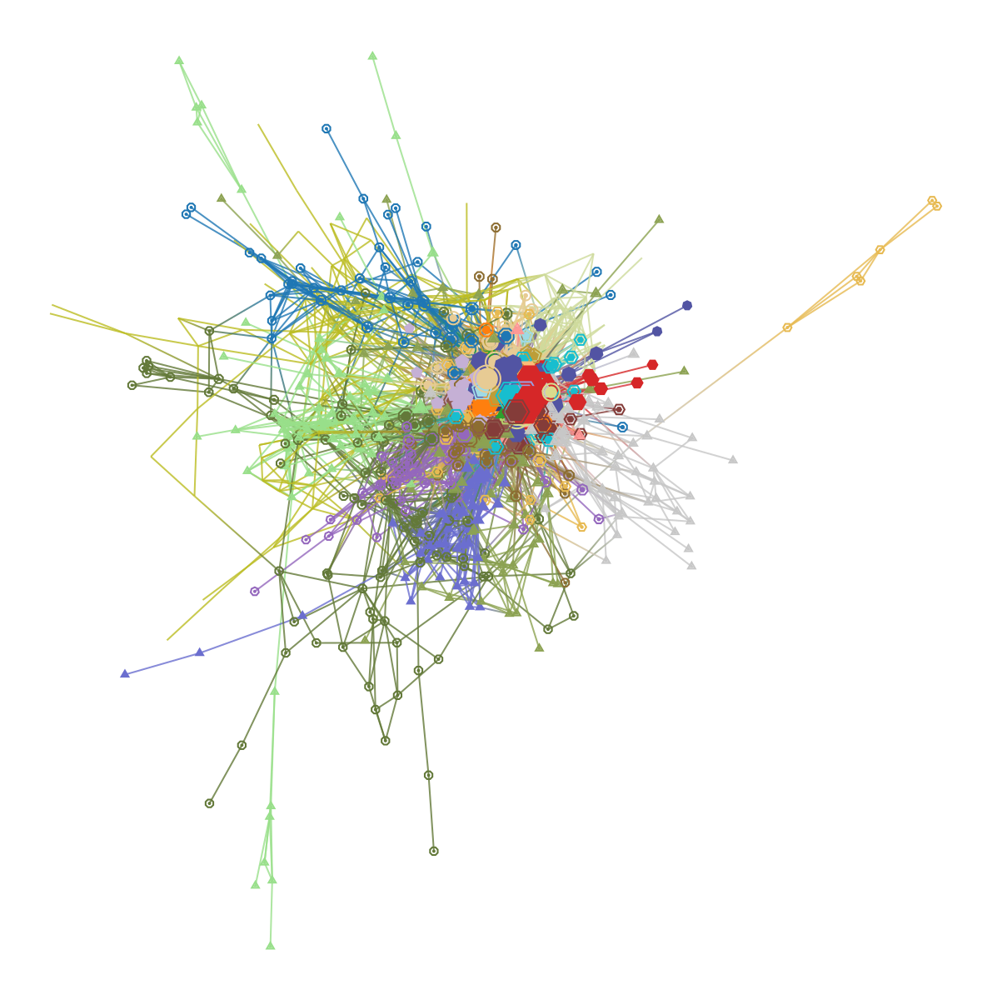

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1ed0d6bd0>

In [72]:
state.draw(pos=pos_fr, vertex_shape=state.get_blocks(), vertex_size=prop_to_size(x, mi=5, ma=25))


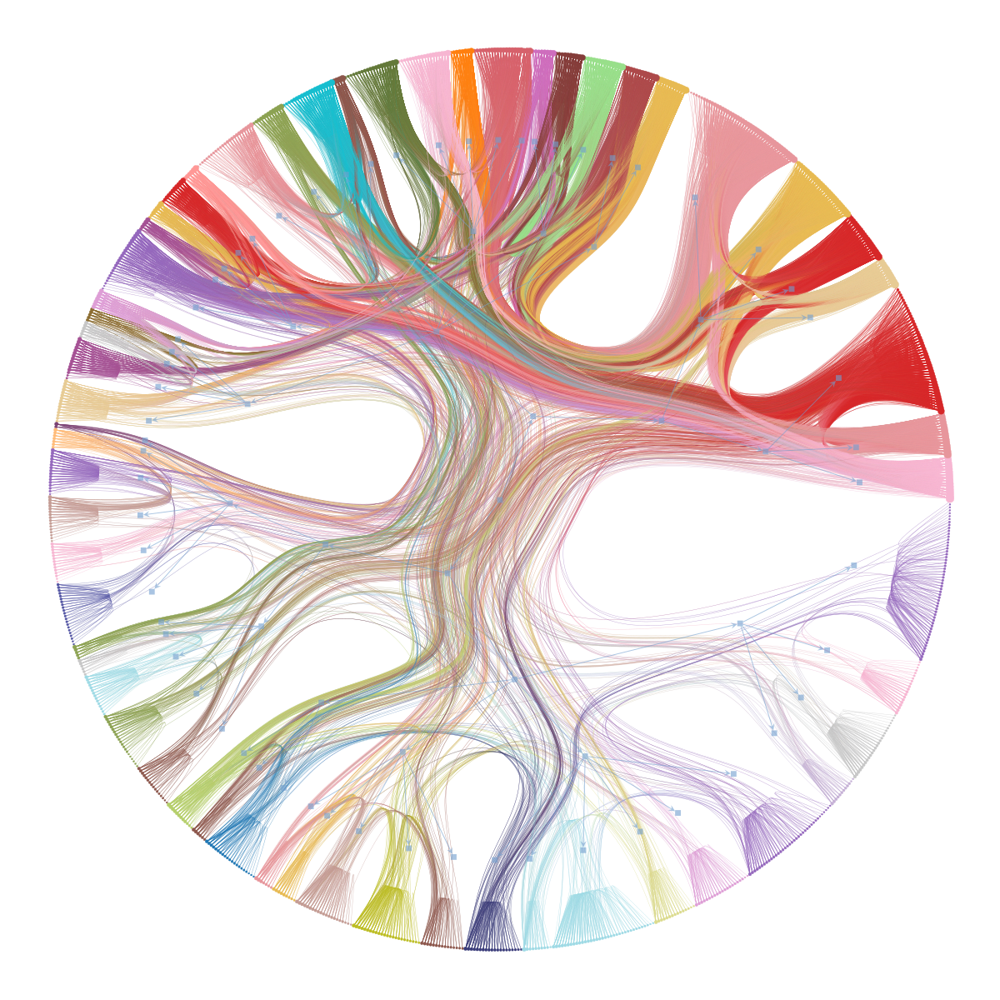

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ece0f050, at 0x1edfc8d50>,
 <GraphView object, directed, with 1044 vertices and 1043 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1edfc4f10, at 0x1ed0d5c10>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1edfc4f10, at 0x1edf4a0d0>, False), at 0x1edfc4f10>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x1edfc4f10, at 0x1ed2419d0>)

In [73]:
state2 = minimize_nested_blockmodel_dl(u)

state2.draw()

In [74]:
print(state.get_blocks().a)

[776 472 645 673 861  29 472 227 776 535 776 749  13 227 618 220 673 161
 472 220  13 875 184 939 184 618 861 939 673 776 479 472 749 184 749 749
 268 776 861 861 861 220 227 479 715 184 618 287 749 479  29 831 749 200
 776 861 715 472 184 220 939 184 287 749 673 673 196  13 673 571 196 831
 749 184 196 196 875 861  29 875 100 100 776 749 200 227 749 939 749 184
 184 196 903 673 749 287 831 831 749 831 472 184 571 749 268 749 875 861
 268 776 220 778 287 196 939 776 535 184 625 571 287 749 268 673 571 196
 874 479 184 472 472 625 625 196 196 749 535 227 645 196 903 184 200 715
 749  13 831 618 903 673 479 903 535 861 903 874 287 184 472 939 196 479
 776 479 903 479 479 903 184 874  13 571  29 571  13 776 268 673 220 778
 749 196 749 479 861  13 184 645 831  29 749 903 479 196 749 434 184 749
 571 939 673 625 571  13 939 220 749 625  29 715 251 749 479 776  29 749
 100 184 749 220 749 861 673 200  13  29 227 673 251 861  13 479 831 749
 903 196 831 479 535 196 184 776 220 479 571 673 64

In [75]:
print(u.vp['string'].a)

KeyError: ('v', 'string')

In [ ]:
u.save("retweets.graphml")

### Other Attempts

In [ ]:
g1=Graph(directed=False)

In [ ]:
g1.add_edge_list(np.transpose(connections.nonzero()))

In [ ]:
pos = sfdp_layout(g1)

In [ ]:
graph_draw(g1, pos)

In [30]:
import graph_tool.all as gt
g = gt.collection.ns["wordnet"]

In [ ]:
state1 = minimize_nested_blockmodel_dl(g)

In [ ]:
print(g)

In [ ]:
g.list_properties()

In [ ]:
g.

In [ ]:
hist = gt.vertex_hist(g, deg)

In [ ]:
y = in_hist[0]
err = np.sqrt(in_hist[0])
plt.errorbar(in_hist[1][:-1], in_hist[0], fmt="o", yerr=err,
        label="in")

y = out_hist[0]
err = np.sqrt(out_hist[0])
plt.errorbar(out_hist[1][:-1], out_hist[0], fmt="o", yerr=err,
        label="out")

plt.yscale("log")
plt.xscale("log")

plt.xlabel("$k$")
plt.ylabel("$NP(k_{in})$")

plt.tight_layout()
plt.legend()

In [ ]:
 from nltk.corpus import wordnet

In [ ]:
from nltk.corpus import wordnet as wn